In [ ]:
# Lets import packages 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

import warnings   #ignore pandas copy df warnings
warnings.filterwarnings('ignore')

# Read main data to pandas dataframes

df20 = pd.read_csv('./datasets/stackoverflow/developer_survey_2020/survey_results_public.csv')
df19 = pd.read_csv('./datasets/stackoverflow/developer_survey_2019/survey_results_public.csv')
# df18 = pd.read_csv('./datasets/stackoverflow/developer_survey_2018/survey_results_public.csv')

# dfs = [df20, df19, df18]
dfs = [df20, df19]

# rename some columns of the old datasets so they match the new ones.
# df18.rename(columns={
#     'ConvertedSalary' : 'ConvertedComp',
#     'JobSatisfaction' : 'JobSat',
#     'YearsCodingProf' : 'YearsCodePro'
#     }, inplace=True)

# Combine DataFrame objects with overlapping columns and return only those that are shared by passing inner to the join keyword argument.
df = pd.concat(dfs, ignore_index=True, join='inner')


In [ ]:
# # inspect intersect of columns between dfs :
# set(df20.columns) & set(df19.columns)

# print(df.shape);

# list(df.columns)

In [ ]:
# df.info()

In [ ]:
## Sneak peak into missing proportions

# missing_proportions = df.isnull().mean().sort_values()
# missing_proportions[1:]

First thoughts :

Question 1 : How is country of residence related to job satisfaction or salary ?

- the proportion of missing values for compensation is 45 % 🤕
- the proportion of missing values for job satisfaction is 26 %

Question 2 : Which developper jobs are better paid ? 

- We will need to separate the values of jobtypes in order to answer this question.

Question 3 : Based on level of influence of respondent, which platforms or technologies are more likely to be used in the following years ?
    
- We could use a mixture of level of influence and platforms wanted in order to answer this question. 

Question 4 : how does salary relates to working experience as a coder ? 
    


In [ ]:
# Analysing our target variables

# print(df['ConvertedComp'].describe())

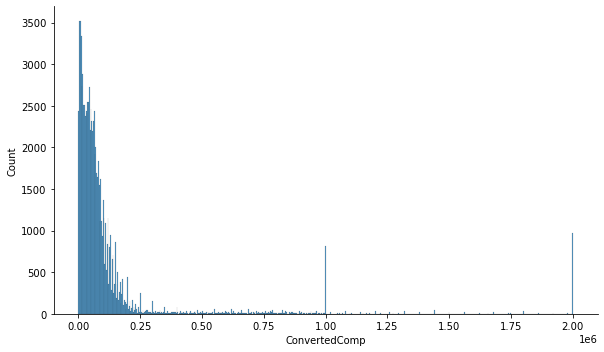

In [ ]:
# getting a visual on distribution of ConvertedComp

# plotting styles
# sns.set_context('talk')     # {paper, notebook, talk, poster}
# sns.set_style('white')   # {darkgrid, whitegrid, dark, white, ticks}

g = sns.displot(df, x="ConvertedComp", aspect=1.7)

- Our target value has a proportion of 45% missing values.
- It looks like the min value is zero, and there are a bunch of those. We will filter out those values becuase they dont really help us for now. 
The max 2.0e+06 seems to high to be real. - We might want to dictate an upper limit ourselves for sake of sanity.

Skewness: 0.801618
Kurtosis: -0.016090


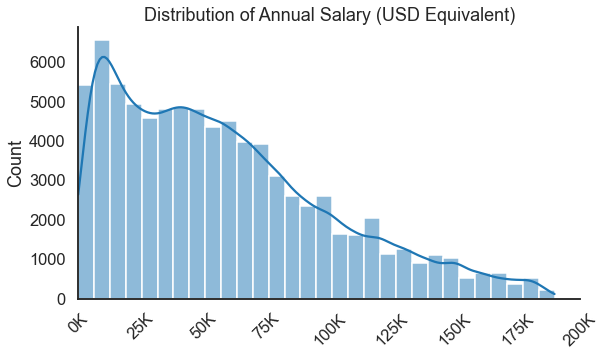

In [ ]:
# Dealing with outliers ... 

# Drop rows without salary information
df.dropna(subset=["ConvertedComp"], inplace=True)

# # filter-out super high salary values (over 200 000 USD per year).
filter_sal = (df['ConvertedComp']>0) & (df['ConvertedComp']<2e+05)
df = df[filter_sal]

# Use z-score to get standard deviations from mean for ConvertedComp. 
# keep only data within a 6 sigma range.  
df = df[(np.abs(stats.zscore(df["ConvertedComp"])) < 3)]
# df = df[(np.abs(stats.zscore(df["Age"])) < 3)]


# plotting styles
sns.set_context('talk')     # {paper, notebook, talk, poster}
sns.set_style('white')   # {darkgrid, whitegrid, dark, white, ticks}

# plot
g = sns.displot(df, x="ConvertedComp", kde=True, bins=30, aspect=1.7)

plt.title('Distribution of Annual Salary (USD Equivalent)')
plt.xlabel("")
plt.xticks(rotation=45);

# format annual Salary labels
xlabels = ['{:,.0f}'.format(x) + 'K' for x in g.ax.get_xticks()/1000]
g.set_xticklabels(xlabels)
plt.axis(xmin=0, xmax=200000);

#skewness and kurtosis
print("Skewness: %f" % df['ConvertedComp'].skew())
print("Kurtosis: %f" % df['ConvertedComp'].kurt())

In [ ]:
print(df['ConvertedComp'].describe())

count     82441.000000
mean      58340.692156
std       42939.134330
min           1.000000
25%       23028.000000
50%       50376.000000
75%       83972.000000
max      189728.000000
Name: ConvertedComp, dtype: float64


That seems more realistic. At least 75% of respondants are falling in the range of 0 to 80k USD per year. 
- The curve does not follow a normal distribution. The median salary is 51k per year.
- For the shape of this curve, we might want to consider a transformation later on.
- It doesn't really shows a real degree of peakedness.

In [ ]:
# import OECD minimum wage data for OECD Countries in 2019. source https://en.wikipedia.org/wiki/List_of_minimum_wages_by_country
avg_wage = pd.read_csv('./datasets/oecd_avgwages2019.csv', sep=';')

# Filter only OECD members
df_oecd = df[df['Country'].isin(avg_wage['Country'])]

# Compute a relative salary using the minimum wage of each country
avgwage_dict = avg_wage.set_index('Country').to_dict(orient='dict')['avgWage2019'] 

df_oecd['CountryAvgWage'] = df_oecd['Country'].map(avgwage_dict)
df_oecd['ConvertedCompRel'] = df_oecd['ConvertedComp']/df_oecd['CountryAvgWage']


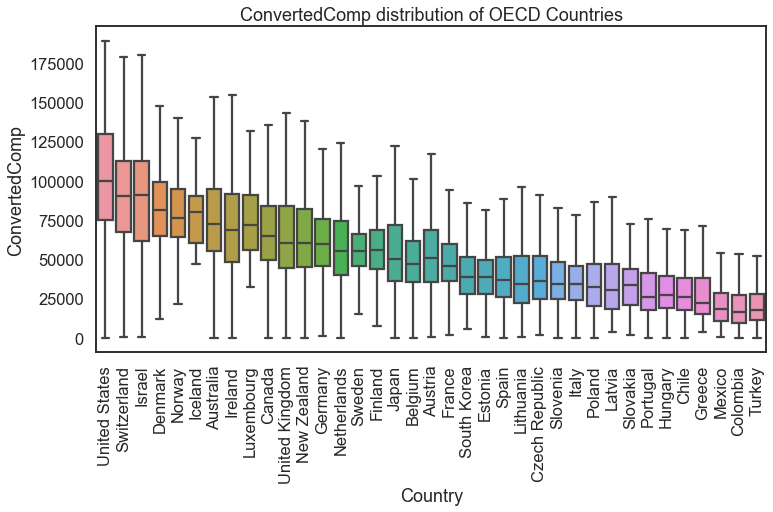

In [ ]:
# box plot Country vs Converted Compensation
var = 'Country'
data = pd.concat([df_oecd['ConvertedComp'], df_oecd[var]], axis=1)

sorted_index = df_oecd.groupby('Country')['ConvertedComp'].mean().sort_values(ascending=False).index

f, ax = plt.subplots(figsize=(12,6))
g = sns.boxplot(x=var, y="ConvertedComp", data=data, order=sorted_index, showfliers = False)

plt.xticks(rotation=90);
plt.title("ConvertedComp distribution of OECD Countries");

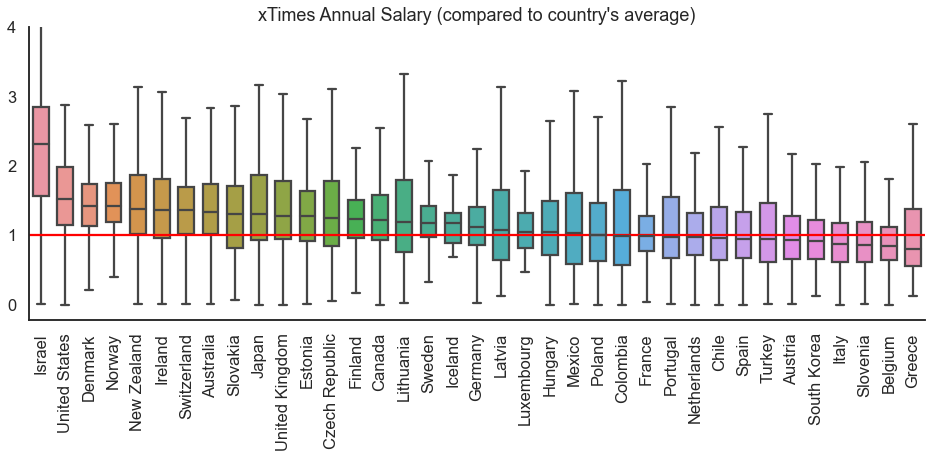

In [ ]:
# Getting the point by comparing to country's average weight.
# # box plot Country vs Relative Compensation (using avg wages)
var = 'Country'
data = pd.concat([df_oecd['ConvertedCompRel'], df_oecd[var]], axis=1)

sorted_index = df_oecd.groupby('Country')['ConvertedCompRel'].median().sort_values(ascending=False).index

g = sns.catplot(x=var, y="ConvertedCompRel", data=data, order=sorted_index, kind='box', aspect=2.7, width=0.65, showfliers = False)
plt.xticks(rotation=90);
# plt.title("Annual Salary in relation to country Average");
plt.axis(ymax=4);

g.ax.axhline(1, ls='-', c="red", )

plt.xlabel(None);
plt.ylabel(None);
plt.title("xTimes Annual Salary (compared to country's average)");


In [ ]:
# # same as graph above but in list mode 

# pd.concat(
#     [
#         df_oecd.groupby("Country").Respondent.count(),
#         df_oecd.groupby('Country')['ConvertedCompRel'].mean()
#     ], axis=1, 
# ).sort_values(ascending=False, by='ConvertedCompRel')


---

## Question 2 : Which developper job types are better paid ? 

- We will need to separate the values of the DevTypes feature in order to answer this question.

In [ ]:
# getting count of all possible devType values

# some of the possible values need to be merged into one same value. 
map_DevTypes = {
    'Educator or academic researcher' : 'Education or research',
    'Educator' : 'Education or research',
    'Academic researcher' : 'Education or research',
    'QA or test developer' : 'Developer, QA or test',
    'Back-end developer' : 'Developer, back-end',
    'Desktop or enterprise applications developer' : 'Developer, desktop or enterprise applications',
    'Embedded applications or devices developer' : 'Developer, embedded applications or devices',
    'Front-end developer' : 'Developer, front-end',
    'Full-stack developer' : 'Developer, full-stack',
    'Game or graphics developer'  : 'Developer, game or graphics',
    'Mobile developer' : 'Developer, mobile'
}

df_oecd['DevType'] = df_oecd['DevType'].replace(map_DevTypes, regex=True)


set_possible_values = set()
value_counts = pd.Series()

for row in df_oecd["DevType"].dropna() :
    
    for value in row.split(';'):
        if value not in set_possible_values :
            value_counts[value] = 0 
            set_possible_values.add(value)
    
        value_counts[value] += 1

print('there are {} possible values at feature.'.format(len(set_possible_values)))

set_possible_values

there are 23 possible values at feature.


{'Data or business analyst',
 'Data scientist or machine learning specialist',
 'Database administrator',
 'Designer',
 'DevOps specialist',
 'Developer, QA or test',
 'Developer, back-end',
 'Developer, desktop or enterprise applications',
 'Developer, embedded applications or devices',
 'Developer, front-end',
 'Developer, full-stack',
 'Developer, game or graphics',
 'Developer, mobile',
 'Education or research',
 'Engineer, data',
 'Engineer, site reliability',
 'Engineering manager',
 'Marketing or sales professional',
 'Product manager',
 'Scientist',
 'Senior executive/VP',
 'Student',
 'System administrator'}

In [ ]:
# plot value count per DevType

# value_counts.sort_values(ascending=False).plot(kind='bar');

In [ ]:
# one-hot encoding the DevType Column 
df_devtype = pd.concat([df_oecd[['ConvertedComp', 'ConvertedCompRel', 'Age']], df_oecd['DevType'].str.get_dummies(sep=";")], 1)
df_devtype.shape 

(59303, 26)

In [ ]:
%%time
list_rows = []

for col in df_devtype.drop(['ConvertedComp', 'ConvertedCompRel', 'Age'], axis=1).columns.tolist() : 
    for index, row in df_devtype[df_devtype[col]==1].iterrows():
        vals = [col, row['ConvertedComp'], row['ConvertedCompRel'], row['Age']]
        list_rows.append(vals)

len(list_rows)

df_melt = pd.DataFrame(list_rows, columns=['DevType','ConvertedComp', 'ConvertedCompRel', 'Age'])

Wall time: 17.6 s


In [ ]:
# sorted_index = df_melt.groupby("DevType")["ConvertedComp"].mean().sort_values().index

# g = sns.catplot(data = df_melt, x='DevType', y='ConvertedComp', order=sorted_index, kind="bar", aspect=2.5)
# plt.xticks(rotation=90);
# plt.axis(ymin=4000);

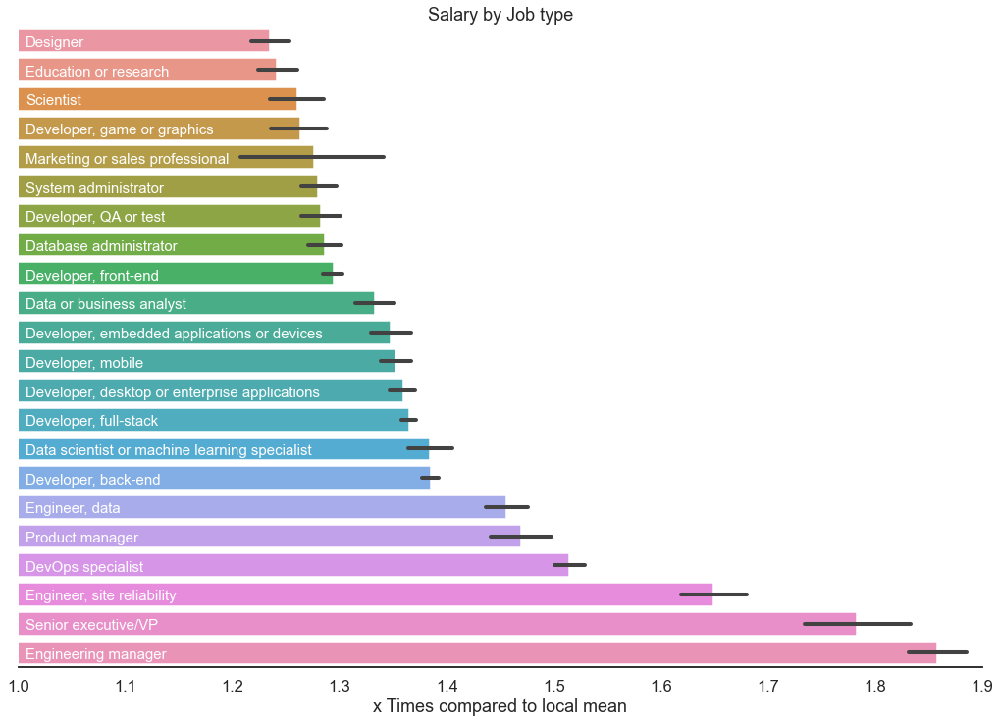

In [ ]:
# exclude student and plot relative salary
df_pro = df_melt[df_melt['DevType'] != 'Student']

means = df_pro.groupby("DevType")["ConvertedCompRel"].mean()
sorted_index = means.sort_values().index

g = sns.catplot(data = df_pro, y='DevType', x='ConvertedCompRel', order=sorted_index, kind="bar", height=10, aspect=1.9)

# chart aesthetics
plt.title('Salary by Job type', size=18)
plt.axis(xmin=1,xmax=1.9);    
plt.ylabel(None)
plt.xlabel("x Times compared to local mean")

# Remove left spine 
plt.yticks([], [])
g.despine(left=True)

ax = g.facet_axis(0,0)
for i, p in zip(sorted_index, ax.patches): 
    ax.text(
        p.get_x() + 1.007,         
        p.get_y() + p.get_height()/2 + .2, 
        i, color='white', size=15
        )


## Can we find job type tendency by type, how can age relates to into management positions ?

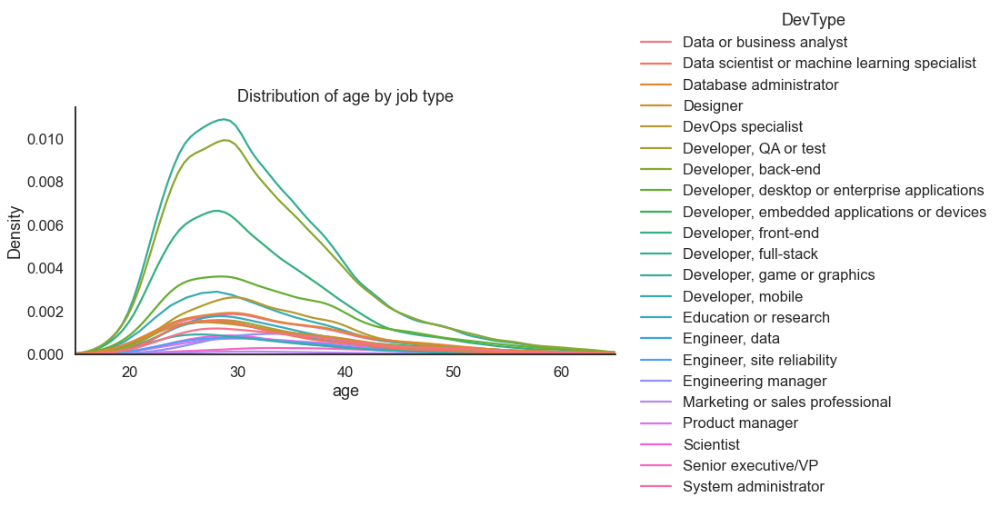

In [ ]:
# distribution plot by age.

# plot
g = sns.displot(df_pro, x="Age", kind="kde", hue="DevType", aspect=2)

plt.title('Distribution of age by job type')
plt.xlabel("age")

plt.axis(xmin=15);
plt.axis(xmax=65);

In [ ]:
df_oecd.shape

(59303, 45)

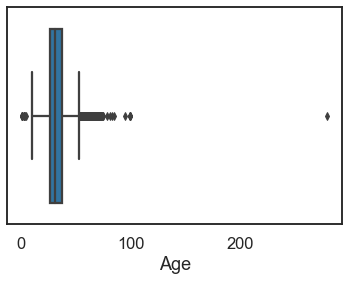

In [ ]:
g = sns.boxplot(data=df_oecd, x="Age")


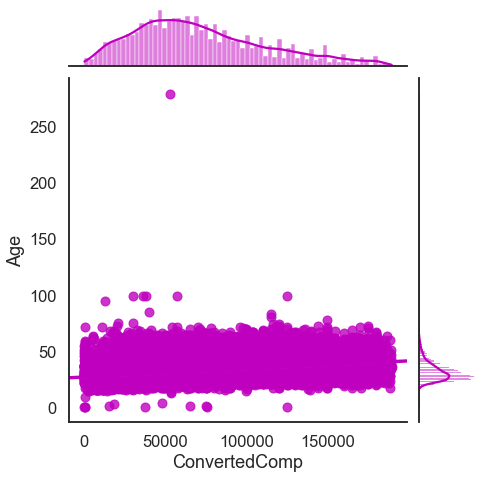

In [ ]:
g = sns.jointplot(x="ConvertedComp", y="Age", data=df_oecd,
                  kind="reg", truncate=False,
                #   xlim=(0, 60), ylim=(0, 12),
                  color="m", height=7)

# how good can we estimate a salary judging by job type and country of residence ? 



In [ ]:
# divide age into ranges

# def rangify_ages(row): 
#     try:
#         float(row['Age'])

#         if float(row['Age']) < 13 :
#             val = 'NaN'
#         elif float(row['Age']) < 18 :
#             val = 'Under 18 years old'
#         elif float(row['Age']) < 25 :
#             val = '18 - 24 years old'
#         elif float(row['Age']) < 35 :
#             val = '25 - 34 years old'
#         elif float(row['Age']) < 45 :
#             val = '35 - 44 years old'
#         elif float(row['Age']) < 55 :
#             val = '45 - 54 years old'
#         elif float(row['Age']) < 65 :
#             val = '55 - 64 years old'
#         else :
#             val = '65 years or older'

#     except :
#         return row['Age']
    
#     return val

# df_oecd['AgeRange'] = df_oecd.apply(rangify_ages, axis=1)

# replace some strings by integers 
map_YearsCodePro = {
    'Less than 1 year' : '0',
    'More than 50 years' : '50',
}

df_oecd['YearsCodePro'] = df_oecd['YearsCodePro'].replace(map_YearsCodePro, regex=True)

In [ ]:
dummies_Country = pd.get_dummies(df_oecd[['Country']], drop_first=True)
dummies_Employment = pd.get_dummies(df_oecd[['Employment']], drop_first=True)
# dummies_AgeRange =  pd.get_dummies(df_oecd[['AgeRange']], drop_first=True)
dummies_DevType = df_oecd['DevType'].str.get_dummies(sep=";")

df_onehot = pd.concat([
    df_oecd[['ConvertedCompRel', 'YearsCodePro']],
    dummies_Country, 
    dummies_Employment,
    # dummies_AgeRange,
    dummies_DevType], 1)

df_onehot.columns

Index(['ConvertedCompRel', 'YearsCodePro', 'Country_Austria',
       'Country_Belgium', 'Country_Canada', 'Country_Chile',
       'Country_Colombia', 'Country_Czech Republic', 'Country_Denmark',
       'Country_Estonia', 'Country_Finland', 'Country_France',
       'Country_Germany', 'Country_Greece', 'Country_Hungary',
       'Country_Iceland', 'Country_Ireland', 'Country_Israel', 'Country_Italy',
       'Country_Japan', 'Country_Latvia', 'Country_Lithuania',
       'Country_Luxembourg', 'Country_Mexico', 'Country_Netherlands',
       'Country_New Zealand', 'Country_Norway', 'Country_Poland',
       'Country_Portugal', 'Country_Slovakia', 'Country_Slovenia',
       'Country_South Korea', 'Country_Spain', 'Country_Sweden',
       'Country_Switzerland', 'Country_Turkey', 'Country_United Kingdom',
       'Country_United States', 'Employment_Employed part-time',
       'Employment_Independent contractor, freelancer, or self-employed',
       'Data or business analyst',
       'Data scienti

In [ ]:
missing_proportions = df_onehot.isnull().mean().sort_values()
missing_proportions[1:]

Country_Sweden            0.000000
Country_Switzerland       0.000000
Country_Turkey            0.000000
Country_United Kingdom    0.000000
Country_United States     0.000000
                            ...   
Country_Poland            0.000000
Country_Portugal          0.000000
Country_Iceland           0.000000
System administrator      0.000000
YearsCodePro              0.002986
Length: 62, dtype: float64

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

df = df_onehot

X = df.drop(columns=['ConvertedCompRel', 'YearsCodePro'], axis=1)

y = df['ConvertedCompRel']
# y = df['ConvertedCompRel']

#Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state=42) 

# Instantiate
lm_model = LinearRegression(normalize=True) 

# Fit 
lm_model.fit(X_train, y_train)

LinearRegression(normalize=True)

In [ ]:
# Predict 
y_test_preds = lm_model.predict(X_test)

# Score : 
# R-squared and y_test
rsquared_score = r2_score(y_test, y_test_preds)
length_y_test = len(y_test)

print("The r-squared score for your model was {} on {} values.".format(rsquared_score, length_y_test))

The r-squared score for your model was 0.23859613575985028 on 17781 values.


model was better when also using df18, ageranges ..., w/o yearscodepro =  0.33

---

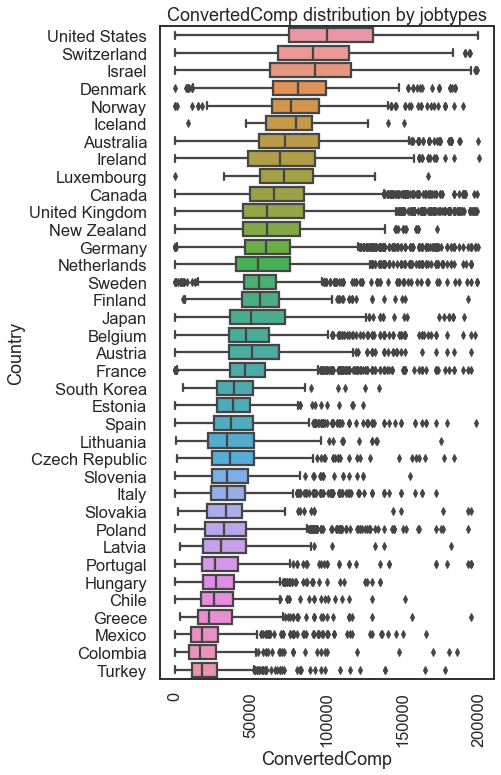

In [ ]:
# Test on outliers ...

# box plot Country vs Converted Compensation
var = 'Country'
data = pd.concat([df_oecd['ConvertedComp'], df_oecd[var]], axis=1)

sorted_index = df_oecd.groupby('Country')['ConvertedComp'].mean().sort_values(ascending=False).index

f, ax = plt.subplots(figsize=(6,12))
ax = sns.boxplot(y=var, x="ConvertedComp", data=data, order=sorted_index)

plt.xticks(rotation=90);
plt.title("ConvertedComp distribution by jobtypes");

# This tell us much more about this dataset! It looks like there are a lot of large outliers in the compensation values. USD outliers may as well be astronomic, yet we dont see them becuase we have already droped all compensation > 200k USD


In [ ]:
# Filter other columns based on a single column
# Specify a column for the zscore, df["ConvertedComp"] for example, and remove .all(axis=1).
import scipy.stats as stats

df_oecd_no_outliers = df_oecd[(np.abs(stats.zscore(df_oecd["ConvertedComp"])) < 3)]

In [ ]:
print("{} outliers removed".format(len(df_oecd) - len(df_oecd_no_outliers)))

27 outliers removed


7         1.043832
9        -0.966322
10       -0.780044
11       -1.399820
12       -0.807763
            ...   
152784    2.581143
152786    1.380119
152787    0.238857
152789   -0.091256
152791   -1.192115
Name: zscores, Length: 59602, dtype: float64
